In [1]:
import os
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from properscoring import crps_ensemble

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime

In [2]:
PROCESSED_PATH = "../data/processed/"
TIME_COLUMN = 'timestamp'

df = pd.read_csv(os.path.join(PROCESSED_PATH, 'model_ready_dataset_5min.csv'),
                 parse_dates=[TIME_COLUMN]).set_index(TIME_COLUMN)


#df.index = df.index.tz_convert('US/Pacific')
df = df.dropna()
df.head()

,RTM_CONG_PRC,RTM_ENE_PRC,RTM_LOSS_PRC,RTM_PRC,DAM_CONG_PRC,DAM_ENE_PRC,DAM_GHG_PRC,DAM_LOSS_PRC,DAM_PRC,2DA_LOAD,...,RTM_PRC_lag90min,RTM_PRC_lag24hr,2DA_LOAD_lag1,RTPD_DMND_lag1,hour,dayofweek,month,year,is_weekend,is_night
timestamp,,,,,,,,,,,,,,,,,,,,,
2023-01-02 14:00:00+00:00,0.0,213.26000,0.0,213.26000,0.0,151.1542,0.0,-2.32777,148.82643,8837.71,...,216.0024,115.95011,8565.53,8490.66,6,0,1,2023,False,False
2023-01-02 14:05:00+00:00,0.0,197.67000,0.0,197.67000,0.0,151.1542,0.0,-2.32777,148.82643,8715.03,...,233.6136,115.95011,8837.71,8690.41,6,0,1,2023,False,False
2023-01-02 14:10:00+00:00,0.0,195.06000,0.0,195.06000,0.0,151.1542,0.0,-2.32777,148.82643,8756.71,...,213.2912,115.95011,8715.03,8690.41,6,0,1,2023,False,False
2023-01-02 14:15:00+00:00,0.0,207.27322,0.0,207.27322,0.0,151.1542,0.0,-2.32777,148.82643,8789.51,...,218.6124,115.95011,8756.71,8690.41,6,0,1,2023,False,False
2023-01-02 14:20:00+00:00,0.0,244.96500,0.0,244.96500,0.0,151.1542,0.0,-2.32777,148.82643,8874.72,...,218.1324,114.72000,8789.51,8789.51,6,0,1,2023,False,False


In [3]:
# define structure for input and target


class DailySequenceDataset(Dataset):
    def __init__(self, input_data, target_data):
        """
        input_data: shape (num_days, seq_len, num_features)
        target_data: shape (num_days, seq_len)
        """
        self.input_data = input_data
        self.target_data = target_data

    def __len__(self):
        return len(self.input_data)

    def __getitem__(self, idx):
        x = self.input_data[idx]
        y = self.target_data[idx]
        return torch.tensor(x, dtype=torch.float32), torch.tensor(y, dtype=torch.float32)
        
# Define the LSTM model
class DailyPricePredictor(nn.Module):
    def __init__(self, input_size, hidden_size=64, num_layers=2, dropout=0.2):
        super(DailyPricePredictor, self).__init__()
        self.lstm = nn.LSTM(input_size=input_size,
                            hidden_size=hidden_size,
                            num_layers=num_layers,
                            dropout=dropout,
                            batch_first=True)
        self.fc = nn.Linear(hidden_size, len(quantiles))

    def forward(self, x):
        out, _ = self.lstm(x)
        out = self.fc(out)
        return out.squeeze(-1)

class QuantileLoss(nn.Module):
    def __init__(self, quantile):
        super().__init__()
        self.q = quantile

    def forward(self, y_pred, y_true):
        error = y_true - y_pred
        return torch.mean(torch.max(self.q * error, (self.q - 1) * error))

In [4]:
# Create derived features
df['RTM-DAM'] = df['RTM_PRC'] - df['DAM_PRC'] #difference between DAM and RTM, used as fitting target


In [5]:
# Define features and target
target = "RTM-DAM"
features = [
    "DAM_PRC",
    "2DA_LOAD",
    "hour",
    "dayofweek",
    "month",
    "year",
    "is_weekend",
    "is_night",
    "RTM_PRC_lag24hr",
]

In [6]:
# Split into train/test and scale data

from sklearn.preprocessing import StandardScaler

x_scaler = StandardScaler()
y_scaler = StandardScaler()

x_scaled = pd.DataFrame(x_scaler.fit_transform(df[features]), columns=df[features].columns)
y_scaled = pd.DataFrame(y_scaler.fit_transform(df[[target]]), columns=df[[target]].columns)
x_scaled.index = df.index
y_scaled.index = df.index

df_scaled = x_scaled.join([y_scaled], how='outer') #combined, scaled dataframe

In [10]:
#train/test split
pts_per_day = 288

cutoff = datetime.fromisoformat('2025-03-01 00:00:00-08:00') #train/test date cutoff

train_df = df_scaled[df_scaled.index < cutoff]
test_df = df_scaled[df_scaled.index >= cutoff]

train_df = train_df.iloc[np.where(train_df.index.hour==8)[0][0]:] #ensure train set starts at 8:00 UTC
test_df = test_df.iloc[:np.where((test_df.index.hour==7)&(test_df.index.minute==55))[0][-1]+1] #ensure test set ends at 7:55 UTC

n_days_train = len(train_df)//pts_per_day
X_train = train_df[features].to_numpy().reshape([n_days_train,pts_per_day,-1])
y_train = train_df[target].to_numpy().reshape([n_days_train,pts_per_day])

n_days_test = len(test_df)//pts_per_day
X_test = test_df[features].to_numpy().reshape([n_days_test,pts_per_day,-1])
y_test = test_df[target].to_numpy().reshape([n_days_test,pts_per_day])


In [21]:
from local_tools import get_mean_crps

# Hyperparameters
input_size = len(features)           # Number of features per timestep
hidden_size = 64
batch_size = 16
quantiles = [0.01, 0.05, 0.1, 0.25, 0.5, 0.75, 0.9, 0.95, 0.99]
num_epochs = 50
learning_rate = 0.001


# Load your actual data here
train_dataset = DailySequenceDataset(X_train, y_train)  # shape: (N, 288, input_size)
test_dataset = DailySequenceDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

# Initialize model
model = DailyPricePredictor(input_size=input_size, hidden_size=hidden_size)
#criterion = nn.MSELoss()
criterion_list = [QuantileLoss(q) for q in quantiles]
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

# Training loop
for epoch in range(num_epochs):
    model.train()
    train_loss = 0.0
    for inputs, targets in train_loader:
        optimizer.zero_grad()
        outputs = model(inputs)

        loss = 0
        for i, q in enumerate(quantiles):
            pred_q = outputs[:,:,i]
            loss += criterion_list[i](pred_q, targets)
        #loss = criterion(outputs, targets)
        
        loss.backward()
        optimizer.step()
        train_loss += loss.item() * inputs.size(0)

    train_loss /= len(train_loader.dataset)

    #model.eval()
    #test_loss = 0.0
    #with torch.no_grad():
    #    for inputs, targets in test_loader:
    #        outputs = model(inputs)
    #        loss = 0
    #        for i, q in enumerate(quantiles):
    #            pred_q = outputs[:,:,i]
    #            loss += criterion_list[i](pred_q, targets)
    #        #loss = criterion(outputs, targets)
    #        test_loss += loss.item() * inputs.size(0)
#
    #test_loss /= len(test_loader.dataset)
    
    model.eval()
    with torch.no_grad():
        out_list = []
        for inputs, targets in test_loader:
            outputs = model(inputs)
            out_list.append(outputs)
        out_list = np.concatenate(out_list)
        out_list = out_list.reshape(-1, out_list.shape[-1])
        crps = get_mean_crps(out_list, y_test.reshape(-1), quantiles)
        

    #print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, test Loss: {test_loss:.4f}")
    print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, CRPS: {crps:.4f}")
    if crps < 0.195:
        break


Epoch 1/50, Train Loss: 1.1622, CRPS: 0.2021
Epoch 2/50, Train Loss: 0.9206, CRPS: 0.2030
Epoch 3/50, Train Loss: 0.8896, CRPS: 0.2005
Epoch 4/50, Train Loss: 0.8732, CRPS: 0.1993
Epoch 5/50, Train Loss: 0.8581, CRPS: 0.1997
Epoch 6/50, Train Loss: 0.8468, CRPS: 0.1973
Epoch 7/50, Train Loss: 0.8443, CRPS: 0.1995
Epoch 8/50, Train Loss: 0.8304, CRPS: 0.1975
Epoch 9/50, Train Loss: 0.8197, CRPS: 0.2013
Epoch 10/50, Train Loss: 0.8143, CRPS: 0.2047
Epoch 11/50, Train Loss: 0.8112, CRPS: 0.1993
Epoch 12/50, Train Loss: 0.8039, CRPS: 0.2020
Epoch 13/50, Train Loss: 0.7995, CRPS: 0.1961
Epoch 14/50, Train Loss: 0.7942, CRPS: 0.1987
Epoch 15/50, Train Loss: 0.7891, CRPS: 0.1994
Epoch 16/50, Train Loss: 0.7937, CRPS: 0.2015
Epoch 17/50, Train Loss: 0.7827, CRPS: 0.1993
Epoch 18/50, Train Loss: 0.7775, CRPS: 0.2015
Epoch 19/50, Train Loss: 0.7766, CRPS: 0.2027
Epoch 20/50, Train Loss: 0.7751, CRPS: 0.2007
Epoch 21/50, Train Loss: 0.7657, CRPS: 0.2002
Epoch 22/50, Train Loss: 0.7694, CRPS: 0.19

KeyboardInterrupt: 

In [22]:
def predict_test_set():
    # Reshape for batch dimension
    x_input = X_test
    
    x_tensor = torch.tensor(x_input, dtype=torch.float32)
    with torch.no_grad():
        y_pred = model(x_tensor)
        
    n_days = x_input.shape[0]
    pts = x_input.shape[1]
    
    y_pred = y_scaler.inverse_transform(y_pred.reshape([n_days*pts, -1]))
    y_act = y_scaler.inverse_transform(y_test.reshape(-1,1)).flatten()

    r = x_input.reshape([n_days*pts, -1])
    X_vals = x_scaler.inverse_transform(r)
    
    return X_vals, y_act, y_pred

## Plotting

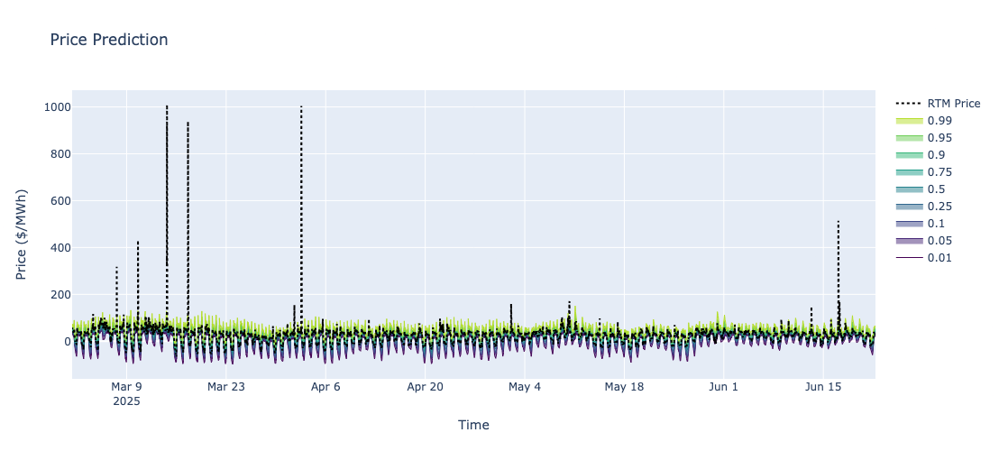

In [28]:
import plotly.graph_objects as go
import plotly.colors as pc

time = test_df.index

fig = go.Figure()

n = len(quantiles)
colors = pc.sample_colorscale('Viridis', [i/n for i in range(n)])

for i, yi in enumerate(y_pred.T):
    if i == 0: 
        fill = None
    else:
        fill = 'tonexty'
    fig.add_trace(go.Scatter(x=time, y=yi + dam, mode='lines', name=quantiles[i], line=dict(width=1,color=colors[i]), fill=fill))

fig.add_trace(go.Scatter(x=time, y=y_act + dam, mode='lines', name='RTM Price', line=dict(width=2, color='black', dash='dot')))


fig.update_layout(title='Price Prediction',
                  xaxis_title='Time',
                  width=1100, 
                  height=500,
                  yaxis_title='Price ($/MWh)',)
fig.show()


## Model Quantification

In [29]:
crps = get_mean_crps(y_pred, y_act, quantiles)
print(crps)

6.191516901524463


In [30]:
# Measure dataset coverage
y_pred_95 = y_pred[:,-2]
y_pred_05 = y_pred[:,2]

coverage = ((y_act >= y_pred_05) & (y_act <= y_pred_95)).mean()
print(f'Total 5-95 Coverage: {coverage:.{3}}')

upper_miss = ((y_act >= y_pred_95).mean())
print(f'Above 95%: {upper_miss:.{3}}')

lower_miss = ((y_act <= y_pred_05).mean())
print(f'Below 5%: {lower_miss:.{3}}')

Total 5-95 Coverage: 0.839
Above 95%: 0.0526
Below 5%: 0.108


In [31]:
# Measure prediction spread

avg_width = (y_pred_95 - y_pred_05).mean()
print(f'Average Prediction Width: {avg_width:.{3}} $/MWh')

Average Prediction Width: 31.2 $/MWh


## Model Export

In [36]:
import joblib
import json

SAVE_DIR = '../models/basic_lstm/'

def save_model_bundle(
    model,
    x_scaler,
    y_scaler,
    model_params: dict,
    save_dir: str,
):
    """
    Save a PyTorch model, feature/target scalers, test data, and hyperparameters into a clean directory.

    Args:
        model: Trained PyTorch model (should inherit from nn.Module)
        x_scaler: Scaler object for input features (e.g., StandardScaler)
        y_scaler: Scaler object for output/target
        model_params (dict): Dictionary of model hyperparameters (e.g., input_size, hidden_size)
        save_dir (str): Target directory for saving model and artifacts
        model_name (str): Base name to use for saved files
    """
    os.makedirs(save_dir, exist_ok=True)

    # File paths
    model_path = os.path.join(save_dir, "model.pt")
    x_scaler_path = os.path.join(save_dir, "x_scaler.pkl")
    y_scaler_path = os.path.join(save_dir, "y_scaler.pkl")
    params_path = os.path.join(save_dir, "params.json")

    # Save model weights
    torch.save(model.state_dict(), model_path)

    # Save scalers
    joblib.dump(x_scaler, x_scaler_path)
    joblib.dump(y_scaler, y_scaler_path)

    # Save model parameters
    with open(params_path, "w") as f:
        json.dump(model_params, f, indent=2)

model_params = {
    'input_size':input_size,
    'hidden_size':hidden_size,
    'num_layers':2,
    'dropout':0.2,
    'quantiles': quantiles,
}

save_model_bundle(model, x_scaler, y_scaler, model_params, SAVE_DIR)
np.savez_compressed(
    SAVE_DIR + "test_data.npz",
    X_test=X_test,  # shape: [n_days, 288, n_features]
    y_test=y_test,   # shape: [n_days, 288] or [..., 1]
    time=test_df.index,
)